In [72]:
import scanpy as sc
import pandas as pd
import numpy as np

import squidpy as sq
import matplotlib.pyplot as plt
from matplotlib import rcParams

import seaborn as sns

In [2]:
adata = sc.read_h5ad("h5ad/scvi/xenium5k_scVI_CellCharter_clustImmune.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [62]:
print(adata.X[1:20, 1:20])

  (0, 11)	2.7609472
  (2, 12)	3.29989
  (2, 16)	3.29989
  (3, 14)	3.671585
  (4, 7)	2.9574163
  (6, 1)	3.1775749
  (10, 7)	3.721409
  (10, 13)	3.721409
  (15, 16)	3.0774934


In [112]:
# Count number of cells per probe (gene)
#cell_counts = adata.layers['counts'].sum(axis=0)
cell_counts = (adata.layers['counts'] > 0).sum(axis=0)

In [113]:
cell_counts[0, :].shape

(1, 5001)

/home/jovyan/my-conda-envs/img/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: ylabel='Count'>

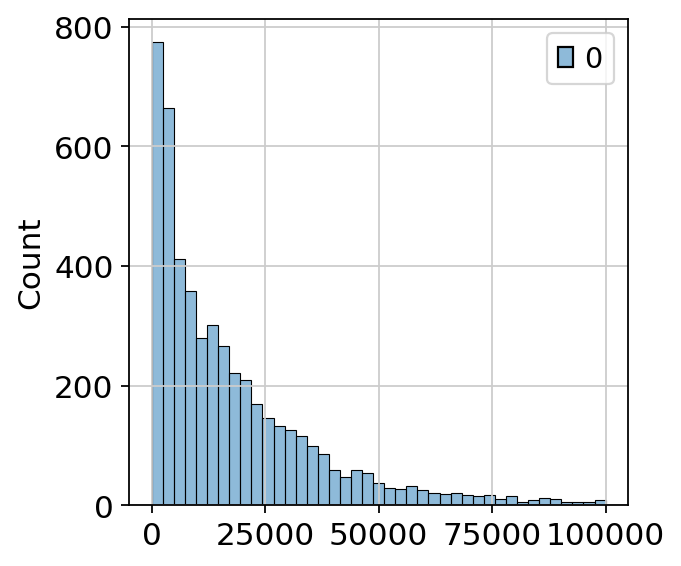

In [114]:
sns.histplot(cell_counts.transpose(), binrange=(0, 100000))

/home/jovyan/my-conda-envs/img/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: ylabel='Count'>

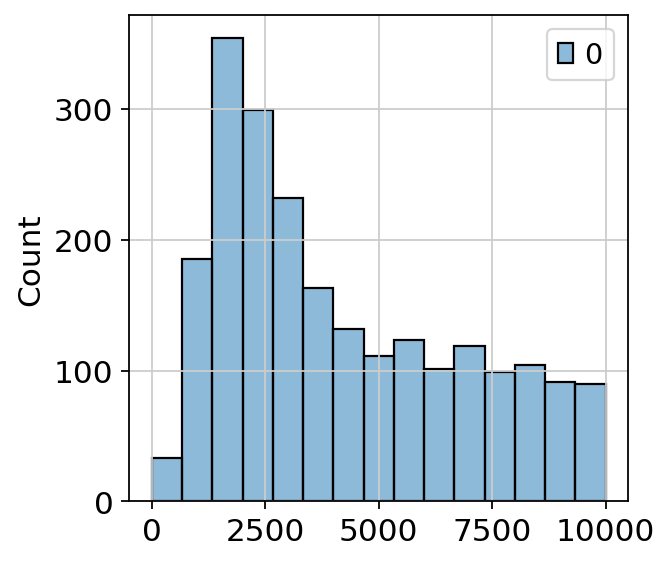

In [115]:
sns.histplot(cell_counts.transpose(), binrange=(0, 10000))

In [4]:
adata.obs.annot.value_counts()

annot
Enterocyte                    117653
B_plasma_IgA1                  54688
B_memory                       54126
SMC_PPLP2                      45725
Trm/em_CD8                     37432
EC_venous                      30492
SMC_CAPN3                      23440
Treg_IL10                      20185
Tnaive/cm_CD4                  19697
Macrophage                     17878
Trm_CD8                        16973
S3_crypt                       14636
Macrophage_LYVE1               12504
Glial/Enteric_neural_crest     12230
S3_oral_mucosa-like            12090
Goblet                         10811
nan                             8890
S3_lamina propria               7801
Myofibroblast_1                 7654
S4                              7532
Pericyte_1                      7467
Monocyte                        7217
Pericyte_2                      6786
vSMC                            6402
S3x_1                           5907
EC_arterial_2                   5857
TA                              

# Differentially expressed genes for annotations and clusters

In [6]:
sc.tl.rank_genes_groups(adata, groupby='annot', method='wilcoxon')

/home/jovyan/my-conda-envs/img/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)
/home/jovyan/my-conda-envs/img/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/jovyan/my-conda-envs/img/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.inser

In [7]:
sc.get.rank_genes_groups_df(adata, group=None, pval_cutoff=0.05).to_csv("tables/markers/global_annotation_wilcoxon_vsRest.csv", index=False)


# Spatial plots of clusters by cell type

In [5]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [38]:
adata.obs.annot.value_counts()

annot
Enterocyte                    117653
B_plasma_IgA1                  54688
B_memory                       54126
SMC_PPLP2                      45725
Trm/em_CD8                     37432
EC_venous                      30492
SMC_CAPN3                      23440
Treg_IL10                      20185
Tnaive/cm_CD4                  19697
Macrophage                     17878
Trm_CD8                        16973
S3_crypt                       14636
Macrophage_LYVE1               12504
Glial/Enteric_neural_crest     12230
S3_oral_mucosa-like            12090
Goblet                         10811
nan                             8890
S3_lamina propria               7801
Myofibroblast_1                 7654
S4                              7532
Pericyte_1                      7467
Monocyte                        7217
Pericyte_2                      6786
vSMC                            6402
S3x_1                           5907
EC_arterial_2                   5857
TA                              

In [39]:
# Format missing values
adata.obs.annot[adata.obs.annot == "nan"] = pd.NA

In [57]:
# Format sample column
adata.obs.sample = adata.obs['sample']
adata.obs.sample

0033516_adjacent_aaaalbkb-1    0033516_adjacent
0033516_adjacent_aaaambfn-1    0033516_adjacent
0033516_adjacent_aaabjcij-1    0033516_adjacent
0033516_adjacent_aaacbbae-1    0033516_adjacent
0033516_adjacent_aaacnfcj-1    0033516_adjacent
                                     ...       
0043587_affected_oinhbmma-1    0043587_affected
0043587_affected_oinhjjbb-1    0043587_affected
0043587_affected_oinhkjfn-1    0043587_affected
0043587_affected_oinihmac-1    0043587_affected
0043587_affected_oinjbpdh-1    0043587_affected
Name: sample, Length: 646121, dtype: category
Categories (4, object): ['0033516_adjacent', '0033516_affected', '0043587_adjacent', '0043587_affected']

In [2]:
rcParams["figure.figsize"] = (6, 6)
sc.set_figure_params(dpi_save=450)

sq.pl.spatial_scatter(
#sc.pl.spatial(
    adata, 
    color=['annot'],
#    groups="S5",
#    palette="tab10",  # recolor to blue
#    crop_coord=(2500, 5500, 4200, 10000),   # x0, y0, x1, y1
    library_key='sample', 
    img=None, 
    title=adata.obs.sample.cat.categories,
    size=6,  # point size
    ncols=4,
    wspace=2.0,
    na_color='lightgrey',
    save="spatial/xenium5k_spatial_annotation.pdf",
    dpi=450
)

NameError: name 'rcParams' is not defined

In [42]:
adata.obs.annot.value_counts()

annot
Enterocyte                    117653
B_plasma_IgA1                  54688
B_memory                       54126
SMC_PPLP2                      45725
Trm/em_CD8                     37432
EC_venous                      30492
SMC_CAPN3                      23440
Treg_IL10                      20185
Tnaive/cm_CD4                  19697
Macrophage                     17878
Trm_CD8                        16973
S3_crypt                       14636
Macrophage_LYVE1               12504
Glial/Enteric_neural_crest     12230
S3_oral_mucosa-like            12090
Goblet                         10811
S3_lamina propria               7801
Myofibroblast_1                 7654
S4                              7532
Pericyte_1                      7467
Monocyte                        7217
Pericyte_2                      6786
vSMC                            6402
S3x_1                           5907
EC_arterial_2                   5857
TA                              5638
Mast                            

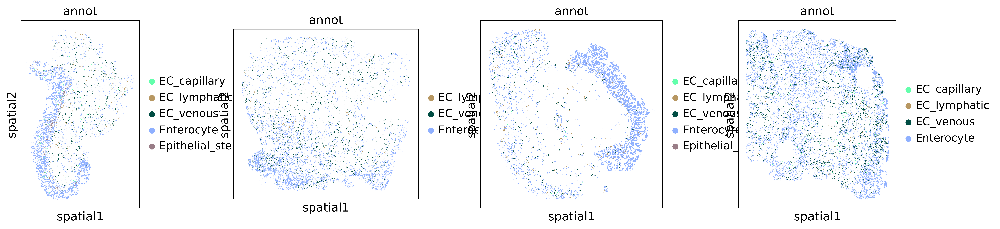

In [43]:
# Test spatial plot showing only some cell types
rcParams["figure.figsize"] = (6, 6)
sc.set_figure_params(dpi_save=450)

sq.pl.spatial_scatter(
    adata, 
    color=['annot'],
    #groups="S5",
    groups=adata.obs.annot.cat.categories[10:15],
    library_key='sample', 
    img=None, 
#    title=adata.obs.sample.cat.categories,
    size=6,  # point size
    ncols=4,
    na_color='lightgrey',
    legend_na=True,
#    save="spatial/cytokines_view1_0033516_affected.pdf",
    dpi=450
)

In [44]:
# Chunk colors
chunks = np.array_split(
    range(len(adata.obs.annot.cat.categories)),
    14) 
chunks

[array([0, 1, 2, 3, 4]),
 array([5, 6, 7, 8]),
 array([ 9, 10, 11, 12]),
 array([13, 14, 15, 16]),
 array([17, 18, 19, 20]),
 array([21, 22, 23, 24]),
 array([25, 26, 27, 28]),
 array([29, 30, 31, 32]),
 array([33, 34, 35, 36]),
 array([37, 38, 39, 40]),
 array([41, 42, 43, 44]),
 array([45, 46, 47, 48]),
 array([49, 50, 51, 52]),
 array([53, 54, 55, 56])]

In [1]:
rcParams["figure.figsize"] = (6, 6)
sc.set_figure_params(dpi_save=450)

for i in range(len(chunks)):
    sq.pl.spatial_scatter(
        adata, 
        color=['annot'],
        groups=adata.obs.annot.cat.categories[chunks[i]],
        library_key='sample', 
        img=None, 
        title=adata.obs.sample.cat.categories,
        size=6,  # point size
        ncols=4,
        na_color='lightgrey',
        legend_na=True,
        wspace=0.7,
        save="spatial/by_cell_type/xenium5k_spatial_subset" + str(i) + ".pdf",
        dpi=450
)

NameError: name 'rcParams' is not defined

In [ ]:
# sq.pl.spatial_scatter(
#     adata, 
#     color=['annot'],
#     groups="TA",
#     palette="tab10",  # recolor to blue
# #    crop_coord=(2500, 5500, 4200, 10000),   # x0, y0, x1, y1
#     library_key='sample', 
#     img=None, 
# #    title=adata.obs.sample.cat.categories,
#     size=6,  # point size
#     ncols=4,
#     na_color='lightgrey',
# #    save="spatial/cytokines_view1_0033516_affected.pdf",
#     dpi=450
# )

In [ ]:
# # Make yes/no column for each cell type
# for cell_type in adata.obs.annot.cat.categories:
#     adata.obs[cell_type] = pd.NA
#     adata.obs[cell_type][adata.obs.annot == cell_type] = 'yes'

In [46]:
# rcParams["figure.figsize"] = (6, 6)
# sc.set_figure_params(dpi_save=450)

# sample = "0033516_affected"
# adata_sub = adata[adata.obs.sample == sample]

# sc.pl.scatter(
#     adata_sub,
#     x='x_centroid',
#     y='y_centroid_inv',
#     color=adata_sub.obs.annot.cat.categories[1],
# #    groups=adata.obs.annot.cat.categories[0:5],
# #    color='annot',
# #    palette="tab10",  # recolor to blue
#     size=6,  # point size
# )

# # sq.pl.spatial_scatter(
# #     adata_sub, 
# #     color=adata_sub.obs.annot.cat.categories[0:10] + ['annot'],
# #     crop_coord=(2500, 5500, 4200, 10000),   # x0, y0, x1, y1
# # #    library_key='sample', 
# #     img=None, 
# # #    title=adata.obs.sample.cat.categories,
# #     size=6,  # point size
# #     ncols=4,
# # #    cmap='RdBu_r', vmin=-4, vmax=4, 
# # #    library_id=sample,
# #     na_color='lightgrey',
# # #    save="spatial/cytokines_view1_0033516_affected.pdf",
# #     dpi=450
# # )

In [78]:
# adata.obs['x'] = adata.obsm['spatial'][:, 0]
# adata.obs['y'] = adata.obsm['spatial'][:, 1]

In [68]:
#adata.obs.x_centroid

In [11]:
#adata.obs['x'] = adata.obs.x_centroid
adata.obs['y_centroid_inv'] = -adata.obs.y_centroid

In [71]:
#adata.obs.x

In [72]:
adata

AnnData object with n_obs × n_vars = 646121 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'fibro_predicted_labels', 'fibro_over_clustering', 'fibro_majority_voting', 'fibro_conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob

In [47]:
# sc.pl.scatter(
#     adata,
#     x='x_centroid',
#     y='y_centroid_inv',
# #    groups=adata.obs.annot.cat.categories[0:5],
#     color='annot',
#  #   palette="tab10",  # recolor to blue
#     size=6,  # point size
#     palette=sc.pl.palettes.default_102
# )

In [48]:
# sc.pl.spatial(
#     adata,
#     groups=adata.obs.annot.cat.categories[0:5],
#     color='annot',
#  #   palette="tab10",  # recolor to blue
#     size=6,  # point size
# #    palette=sc.pl.palettes.default_102
#     img_key=None,
#     library_id='0033516_adjacent'
# )

In [49]:
# sc.pl.scatter(
#     adata,
#     x='x_centroid',
#     y='y_centroid_inv',
#     groups=adata.obs.annot.cat.categories[0:5],
#     color='annot',
# #    palette="tab10",  # recolor to blue
#     size=6,  # point size
# )

In [50]:
# sq.pl.spatial_scatter(
#         adata, 
#         color=['annot'],
#         groups=adata.obs.annot.cat.categories[0:5],
# #        palette="tab10",  # recolor to blue
#     #    crop_coord=(2500, 5500, 4200, 10000),   # x0, y0, x1, y1
#         library_key='sample', 
#         img=None, 
#     #    title=adata.obs.sample.cat.categories,
#         size=6,  # point size
#         ncols=4,
#         na_color='lightgrey',
#         legend_na=True,
# #        save="spatial/by_cell_type/spatial_1.pdf",
#         dpi=450
# )

In [51]:
# for cell_type in adata.obs.annot.cat.categories:
#     sq.pl.spatial_scatter(
#         adata, 
#         color=['annot'],
#         groups=cell_type,
#         palette="tab10",  # recolor to blue
#     #    crop_coord=(2500, 5500, 4200, 10000),   # x0, y0, x1, y1
#         library_key='sample', 
#         img=None, 
#     #    title=adata.obs.sample.cat.categories,
#         size=6,  # point size
#         ncols=4,
#         na_color='lightgrey',
#         save="spatial/by_cell_type/spatial_" + cell_type + ".pdf",
#         dpi=450
# )